# Training and deployment of a YOLOv5 model for object detection

## 🌟 Overview

In this tutorial, you will learn how to work with the YOLOv5 object detection model. We’ll guide you through downloading, training, and deploying the model on a Luxonis device, with clear code comments to help you follow along.

## 📜 Table of Contents
- [🛠️ Installation](#️installation)
- [🗃️ Data Preparation](#data-preparation)
- [🏋️‍♂️ Training](#️️training)
- [✍ Validation](#validation)
- [🧠 Infer](#infer)
- [💾 Weights Download](#weights)
- [🗂️ Conversion](#conversion)
- [📷 DepthAI Script](#depthai-script)


*Note:* In this tutorial, we will train the model on a SKU-110k. If you wish to create your own data set, you are welcome to follow the first three steps on [YoloV5 official tutorial](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data), as you will have to create a *.yaml* file. Luckily, YoloV5 comes with some pre-existing YAMLs, which you can find in the [data directory](https://github.com/ultralytics/yolov5/tree/master/data).

<a name="️installation"></a>

## 🛠️ Installation

Clone YoloV5 repository to the working directory.

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17265, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (82/82), done.
remote: Total 17265 (delta 46), reused 10 (delta 10), pack-reused 17173 (from 5)
Receiving objects: 100% (17265/17265), 16.00 MiB | 13.33 MiB/s, done.
Resolving deltas: 100% (11791/11791), done.


Install the required dependencies.

In [ ]:
%cd yolov5/
# !pip install -U -q -r requirements.txt # install dependencies
!pip install numpy==1.26.4 matplotlib>=3.3 opencv-python>=4.1.1 pillow>=10.3.0 psutil PyYAML>=5.3.1 requests>=2.32.2 scipy>=1.4.1 thop>=0.1.1 torch>=1.8.0 torchvision>=0.9.0 tqdm>=4.66.3 ultralytics>=8.2.34 pandas>=1.1.4 seaborn>=0.11.0 setuptools>=70.0.0

/content/yolov5


<a name ="data-preparation"></a>

## 🗃️ Data Preparation

If you are using a custom dataset, you will have to prepare your dataset for training, as stated in the first 3 steps on [YoloV5 Wiki](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data#train-on-custom-data). Once you have set up YAML and sorted labels and images into the right directories, you can continue with the next step.

Luckily, we are using SKU-110K, for which YAML already exists. If you inspect the [YAML](https://github.com/ultralytics/yolov5/blob/master/data/SKU-110K.yaml), you can see that there is also code for downloading and preprocessing of the dataset, so that it satisfies the required file structure. This code is automatically executed when we run the train.py and the dataset is not yet downloaded.

<a name ="️️training"></a>

## 🏋️‍♂️ Training

Before we begin the training, we have to choose the pretrained model. This image from YoloV5 documentation quickly summarizes them. You can find more about the models [here](https://github.com/ultralytics/yolov5#pretrained-checkpoints).

![YoloV5 Models](https://github.com/ultralytics/yolov5/releases/download/v1.0/model_comparison.png)

We select the YOLOv5s as it is one of the smallest and quickest. You can also experiment with heavier models, but it might affect the FPS on Oak-D devices. For example, I get 15-18 FPS using YOLOv5s on my Oak-D device.

Script provided for training the model *train.py* has a lot of settable parameters which you can see below. We will use *weights, data, epochs, batch*, and *img*, but you can also use others such as *freeze*.

In [ ]:
!python train.py -h

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-01-18 20:18:45.523306: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-18 20:18:45.558093: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-18 20:18:45.568073: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to regi

Before training we can also launch the TensorBoard, that will allow us to inspect the training.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

We will set image size *img* to 416. We will train the model with *batch* size of 32 for 1 *epochs*. We set *data* to SKU-110K.yaml and provide the inital checkpoint *weights* to previously selected yolov5n.pt, which will be downloaded automatically.

For the real training, *epochs* should be higher (typically between 300-1000 epochs).

In [5]:
! python train.py --img 416 --batch 32 --epochs 1 --data SKU-110K.yaml --weights yolov5n.pt --device 0

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-01-18 20:19:34.282355: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-18 20:19:34.314345: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-18 20:19:34.323812: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train:

*Note that we ignore the corrupted JPG warnings, as this tutorial serves for demonstration purposes.*

<a name ="validation"></a>

## ✍ Validation

After training our model, we can validate it on the validation set of our dataset.

In [6]:
!python val.py --weights runs/train/exp/weights/best.pt --data SKU-110K.yaml --img 416 --iou 0.65 --half

val: data=/content/yolov5/data/SKU-110K.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
val: Scanning /content/datasets/SKU-110K/val.cache... 588 images, 0 backgrounds, 0 corrupt: 100% 588/588 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_0.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_115.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_127.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110

<a name ="infer"></a>

## 🧠 Infer

Usually, we also want to visualize the prediction of the trained model on test images to ensure it does what it is supposed to do. This is called inference, and we'll perform it on one image from the test set.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --source ../datasets/SKU-110K/images/test_0.jpg

Now, let's visualize one of the predictions.

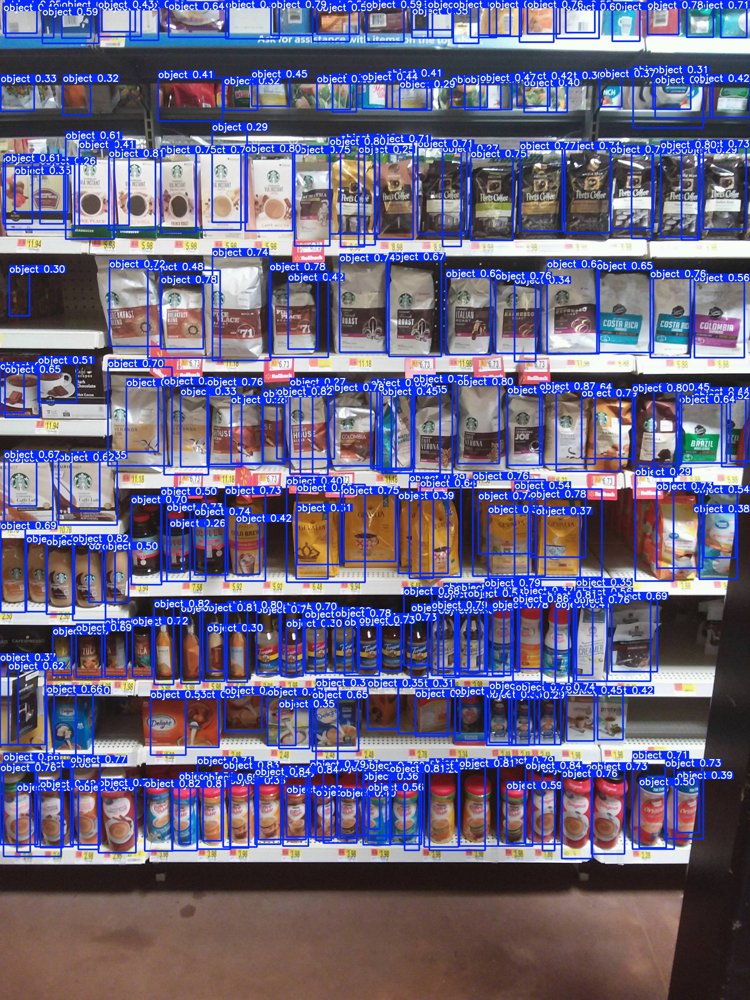

In [8]:
import IPython

# Path to the prediction file
img_file = "runs/detect/exp/test_0.jpg"

# Show the image
IPython.display.Image(img_file)

<a name="weights"></a>

## 💾 Weights Download

By default, the library saves the weights with the best performance into the `best_ckpt.pt` file inside the corresponding run folder. We'll rename it to reflect the model better.

In [9]:
!cp runs/train/exp/weights/best.pt yolov5ntrained.pt

We'll download the weights to convert them in the next step.

In [10]:
from google.colab import files
files.download("yolov5ntrained.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We have the trained model, and the goal is to deploy it to the Luxonis device. The model's specific format depends on the Luxonis device series you have. To simplify the process, we recommend you use our [`HubAI`](https://hub.luxonis.com) platform. You can log in, navigate to the AI section, and click the `+ Add Model` button. 

Please select `YOLO` as a model type.

<img src="./media/hub_model_type.png" alt="HubAI model type selection" width="640">

Then, choose your desired target platform (RVC2, RVC3, or RVC4). In our case, we will use RVC2.

<img src="./media/hubai_target_platform.png" alt="HubAI model platform selection" width="640">

Then, fill out the form on the image below with the information about your model.

<img src="./media/yolov6n_upload.png" alt="Exported model on HubAI" width="640">

After that, fill in specific information about the RVC2 export.

Here are the class names for you to copy:
```
aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,diningtable,dog,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor
```

<img src="./media/yolov6n_rvc2.png" alt="Exported model on HubAI" width="640">

Choose the input image size. In our case, we will use `512x288`.

<img src="./media/yolo_rvc2_shape.png" alt="Exported model on HubAI" width="640">

Finally, click `Export` and wait for the model to be converted. The process might take some time, but after it's finished, we can download the model and use it with our DepthAI script. We'll use RVC2 in this tutorial, but you can follow the same process for other versions. All that is left to do is create a DepthAI script and deploy the model to the device. We already made such an example below. There are two variables that you need to populate, though:
- `ModelSlug`: This is a string representation of your model version based on which DepthAI can download it. You can get it by clicking the `Copy` button next to the `Convert` you used before.
- `ApiToken`: Since this model is private to your team, you need a token to access it. To generate the token, we navigate to team settings and click `+ Create API Token`. We then copy and paste it into the script below. 

<img src="./media/yolov6n_model_card.png" alt="Exported model on HubAI" width="800">

YOLOv5n SKU-110k
Trained YOLOv5n object detection model on SKU-110k dataset.
object


In [ ]:
MODEL_SLUG = "insert_your_model_slug_here" # TODO: Insert your model slug
API_TOKEN = "insert_your_token_here" # TODO: Insert your API Token

To check out other possible ways to convert your model for our devices, please refer to our [documentation](https://rvc4.docs.luxonis.com/software/ai-inference/conversion/rvc-conversion/).

<a name="depthai-script"></a>

## 📷 DepthAI Script

Now, let's install `DepthAI v3`:

In [ ]:
!pip install -q --extra-index-url https://artifacts.luxonis.com/artifactory/luxonis-python-release-local/ depthai==3.0.0a11

Finally, here's the script to run the YOLOv6 model on a device using DepthAI:

In [ ]:
import cv2
import depthai as dai
import numpy as np
from depthai_nodes import ParsingNeuralNetwork
from depthai_nodes.ml.messages import (
    ImgDetectionExtended,
    ImgDetectionsExtended
)
from typing import List
import time
import os

os.environ["DEPTHAI_HUB_API_KEY"] = API_TOKEN

labels = [
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat", "chair", "cow", "diningtable", "dog",
    "horse", "motorbike", "person", "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

def draw_extended_image_detections(
    frame: np.ndarray, detections: List[ImgDetectionExtended], labels=None
):
    """Draws (rotated) bounding boxes on the given frame."""
    for detection in detections:
        rect = detection.rotated_rect
        points = rect.getPoints()

        bbox = np.array([[point.x, point.y] for point in points])
        if np.any(bbox < 1):
            bbox[:, 0] = bbox[:, 0] * frame.shape[1]
            bbox[:, 1] = bbox[:, 1] * frame.shape[0]
        bbox = bbox.astype(int)
        cv2.polylines(frame, [bbox], isClosed=True, color=(255, 0, 0), thickness=2)

        outer_points = rect.getOuterRect()
        xmin = int(outer_points[0] * frame.shape[1])
        ymin = int(outer_points[1] * frame.shape[0])
        cv2.putText(
            frame,
            f"{detection.confidence * 100:.2f}%",
            (xmin + 10, ymin + 20),
            cv2.FONT_HERSHEY_TRIPLEX,
            0.5,
            (255, 0, 0),
        )
        if labels is not None:
            cv2.putText(
                frame,
                labels[detection.label],
                (xmin + 10, ymin + 40),
                cv2.FONT_HERSHEY_TRIPLEX,
                0.5,
                (255, 0, 0),
            )

    return frame


def visualize_yolo_extended(
    frame: np.ndarray, message: ImgDetectionsExtended, extraParams: dict
):
    """Visualizes the YOLO pose detections or instance segmentation on the frame."""
    detections = message.detections
    classes = extraParams.get("classes", None)

    if classes is None:
        raise ValueError("Classes are required for visualization.")

    frame = draw_extended_image_detections(frame, detections, classes)

    cv2.imshow("YOLO Object Detection", frame)
    if cv2.waitKey(1) == ord("q"):
        cv2.destroyAllWindows()
        return True

    return False


device = dai.Device()
platform = device.getPlatform()

model = dai.NNArchive(dai.getModelFromZoo(dai.NNModelDescription(MODEL_SLUG, platform.name)))
with dai.Pipeline(device) as pipeline:
# with dai.Pipeline() as pipeline:
    camera_node = pipeline.create(dai.node.Camera).build()
    nn_with_parser = pipeline.create(ParsingNeuralNetwork).build(camera_node, model)

    parser_output_queue = nn_with_parser.out.createOutputQueue()
    frame_queue = nn_with_parser.passthrough.createOutputQueue()

    pipeline.start()

    while pipeline.isRunning():
        frame: np.ndarray = frame_queue.get().getCvFrame()
        nn_output: dai.ImgDetections = parser_output_queue.get()

        if visualize_yolo_extended(frame, nn_output, extraParams={"classes": labels}):
            pipeline.stop()
            break

Yay! 🎉🎉🎉 Huge congratulations, you have successfully finished this tutorial in which you trained and deployed a pre-trained YOLOv5 nano object detection model to our cameras!